In [2]:
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt
import scipy.fftpack as fp
from scipy import fftpack
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage
from PIL import Image
from numpy import asarray
from skimage.transform import resize
from os import listdir
from os.path import isfile, join

In [18]:
#ici seulement quelque image tester on ete garder dans ce notebook, changer le chemin pour pouvoir tester sur tt le jeux de donner.

C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\4212286449.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


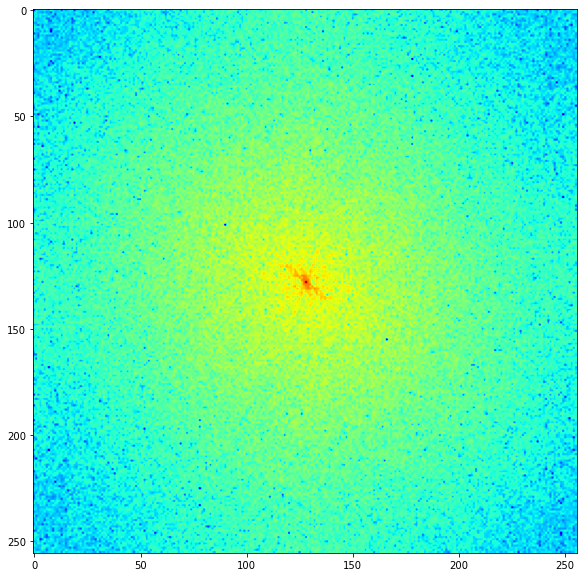

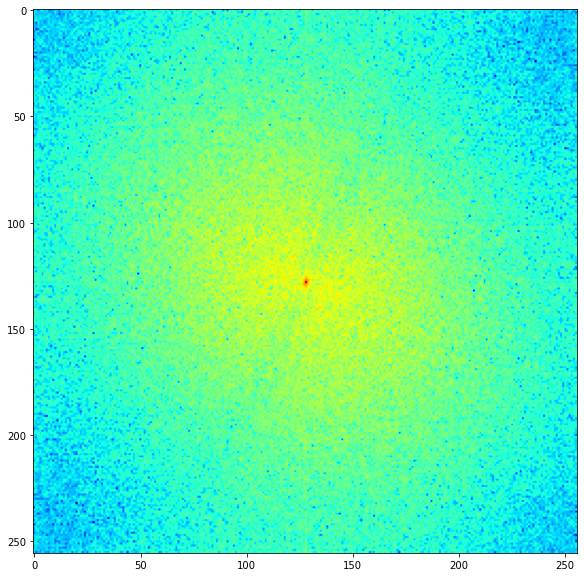

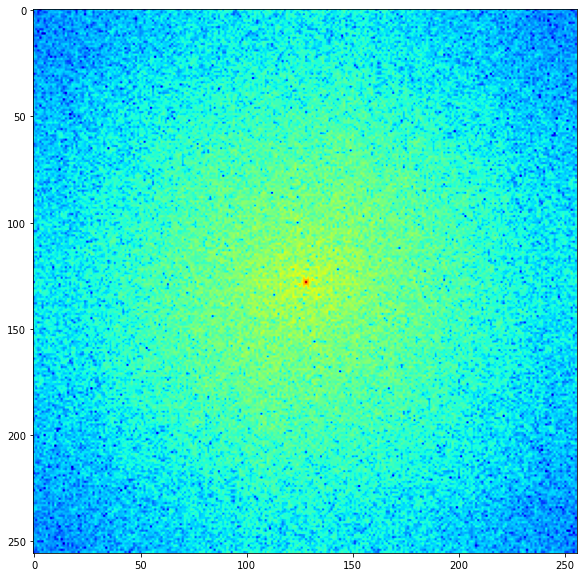

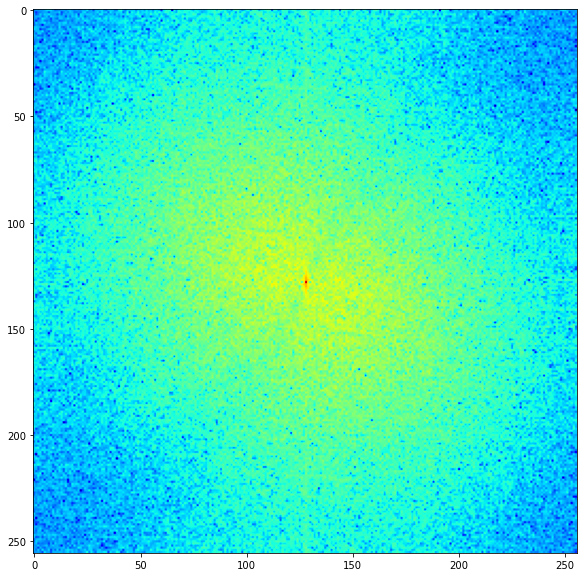

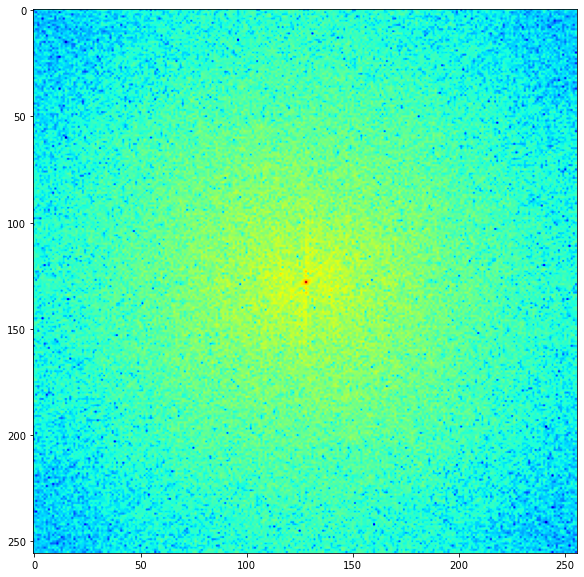

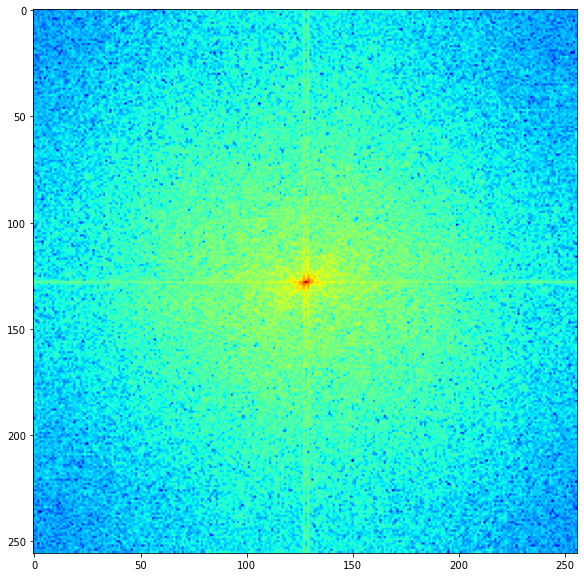

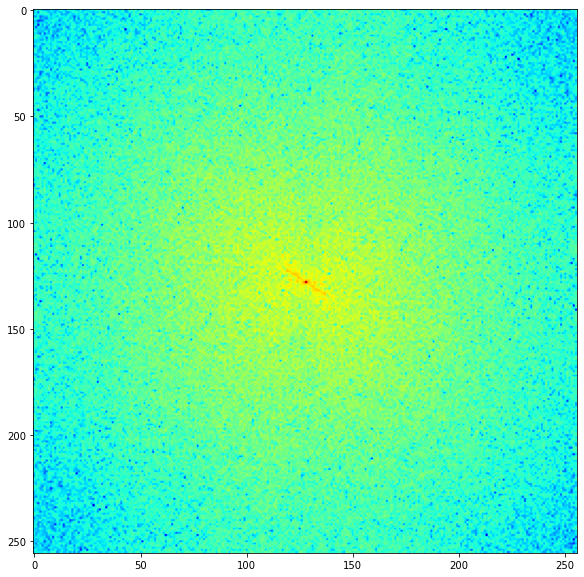

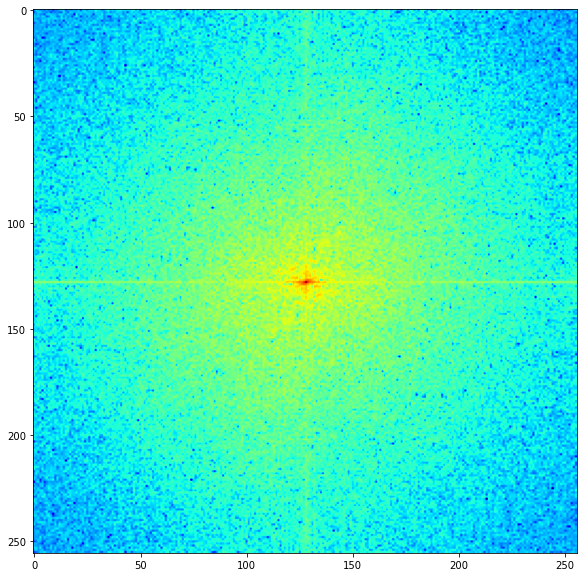

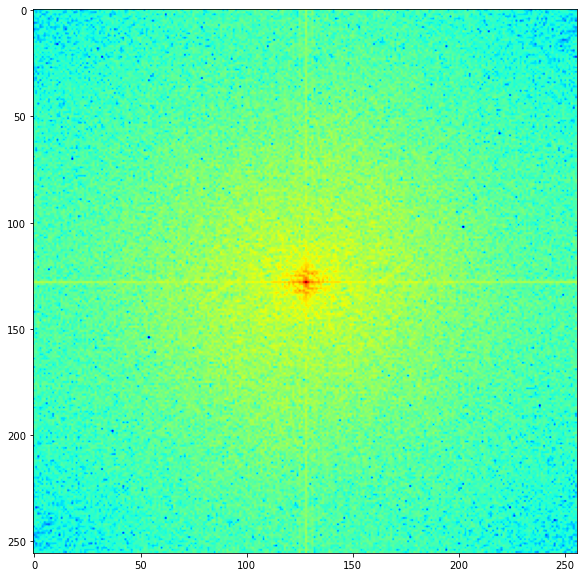

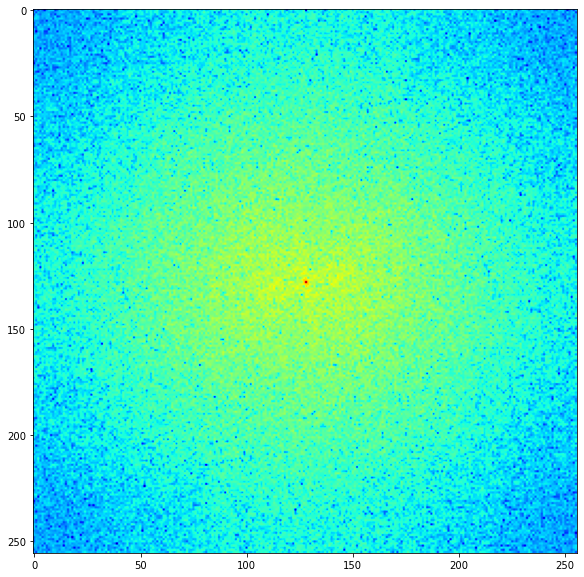

In [4]:

onlyfiles = [f for f in listdir('./real/') if isfile(join('./real/', f))]

for i in onlyfiles: 
    im = np.mean(imread('./real/'+str(i)), axis=2)
    #im=im[64:192,64:192]
    F1 = fftpack.fft2((im).astype(float))
    F2 = fftpack.fftshift(F1)
    plt.figure(figsize=(10,10))
    plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
    plt.show()
    '''
    dark_image_grey_fourier= np.fft.fftshift(np.fft.fft2(im.astype(float)))
    plt.figure(num=None, figsize=(8, 6), dpi=80)
    plt.imshow(np.log(abs(dark_image_grey_fourier)), cmap=plt.cm.jet)
    '''
    

C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\4256216695.py:12: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


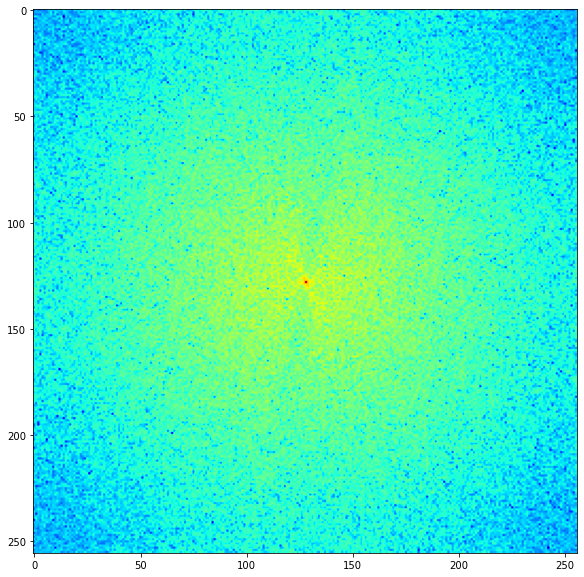

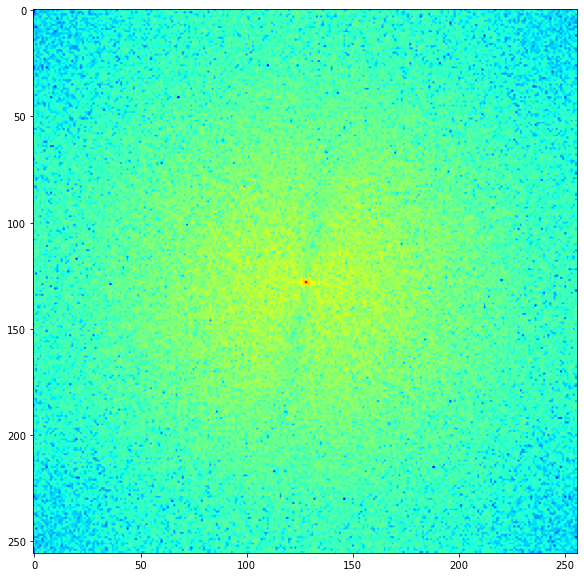

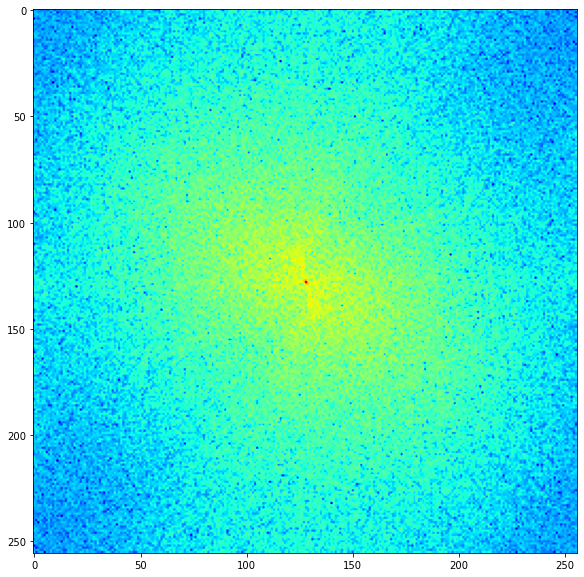

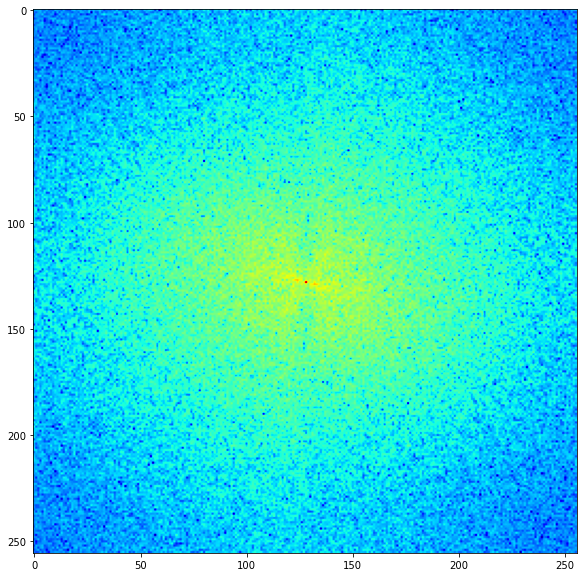

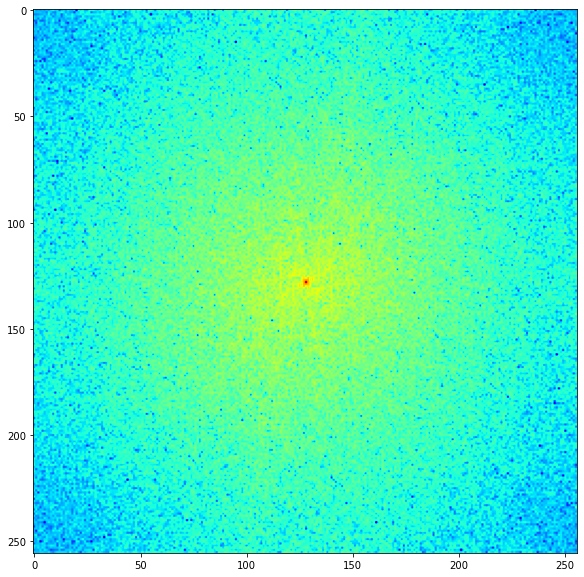

...

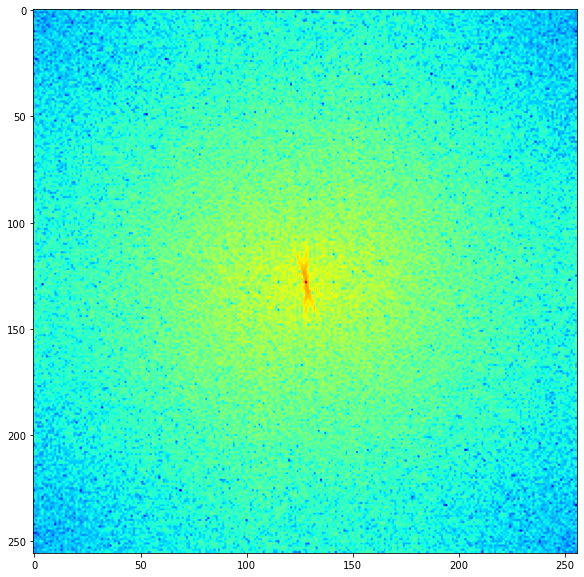

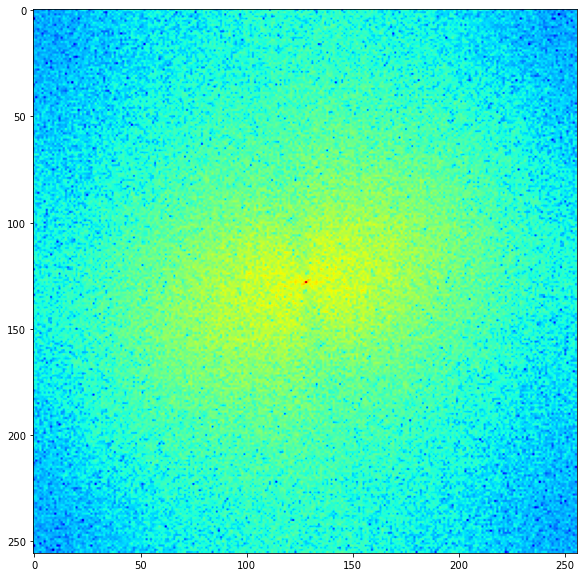

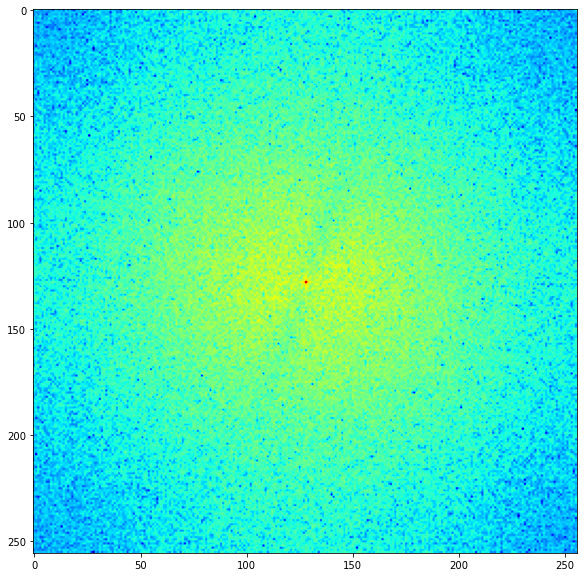

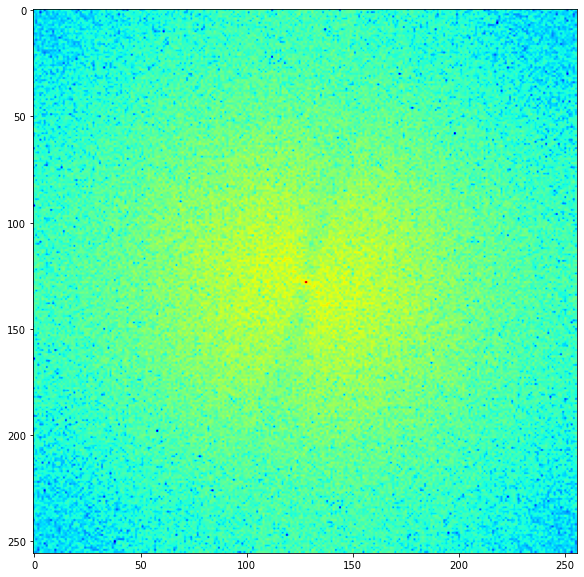

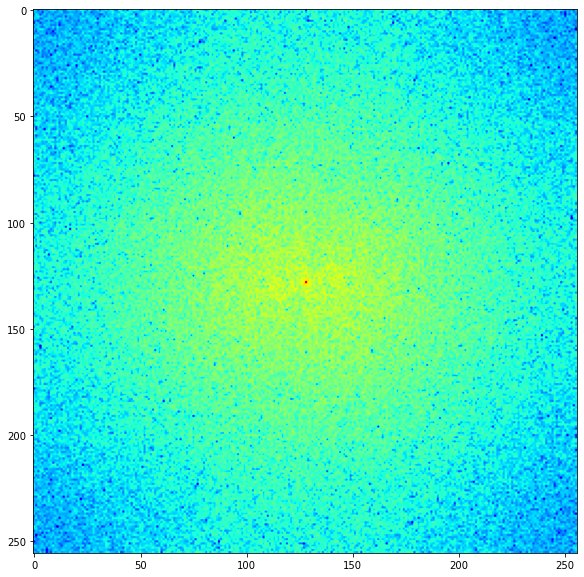

In [5]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir('./fake/') if isfile(join('./fake/', f))]

for i in onlyfiles: 
    im=imread('./fake/'+str(i))
    im=resize(im, (256, 256),anti_aliasing=True)
    im = np.mean(im, axis=2)
    F1 = fftpack.fft2((im).astype(float))
    F2 = fftpack.fftshift(F1)
    plt.figure(figsize=(10,10))
    plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
    plt.show()

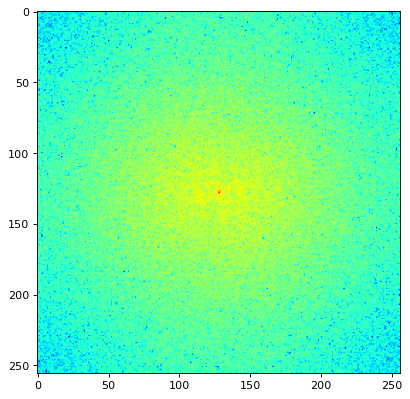

In [6]:
dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(im))
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(np.log(abs(dark_image_grey_fourier)), cmap=plt.cm.jet);

In [7]:
#un autre petit test, parmis plein dautre

In [8]:

def plot(data, title):
    plot.i += 1
    plt.subplot(2,2,plot.i)
    plt.imshow(data)
    plt.gray()
    plt.title(title)
plot.i = 0

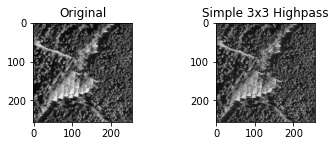

In [9]:


im = Image.open('./real.png').convert('L')
data = np.array(im, dtype=float)
plot(data, 'Original')

#highpass filter
kernel = np.array([[-1, -1, -1,-1],
                   [-1,  8, 8,-1],
                   [-1, 8, 8,-1],
                  [-1,-1,-1,-1]])
highpass_3x3 = ndimage.convolve(data, kernel)
plot(highpass_3x3, 'Simple 3x3 Highpass')


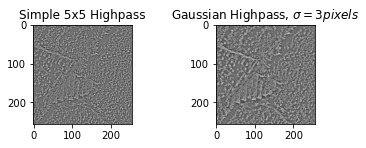

C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\1056386748.py:19: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


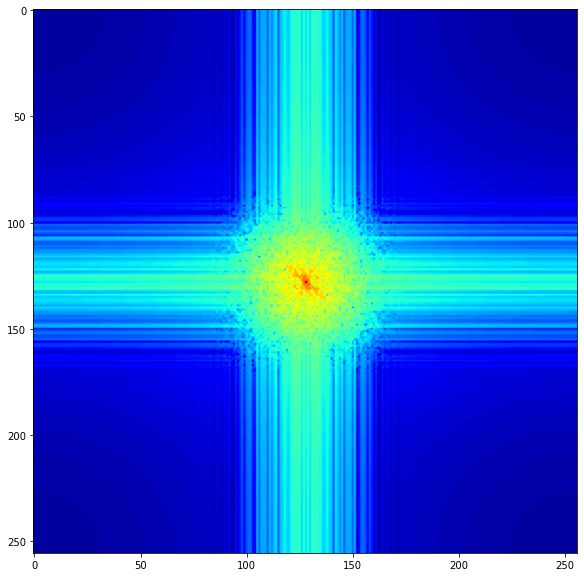

In [10]:

# un autre highpass filter 
kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1,  1,  2,  1, -1],
                   [-1,  2,  4,  2, -1],
                   [-1,  1,  2,  1, -1],
                   [-1, -1, -1, -1, -1]])
highpass_5x5 = ndimage.convolve(data, kernel)
plot(highpass_5x5, 'Simple 5x5 Highpass')

lowpass = ndimage.gaussian_filter(data, 3)
gauss_highpass = data - lowpass
plot(gauss_highpass, r'Gaussian Highpass, $\sigma = 3 pixels$')

plt.show()

F1 = fftpack.fft2((lowpass).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
plt.show()


C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\4115778673.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


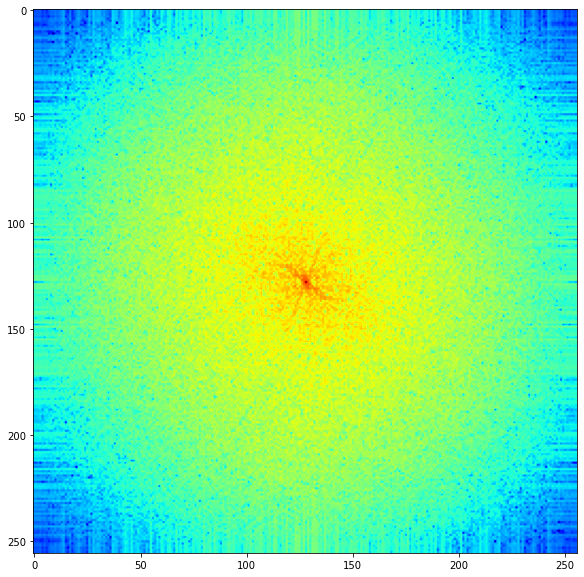

In [11]:

F1 = fftpack.fft2((highpass_3x3).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
plt.show()


In [14]:

def plot(data, title):
    plot.i += 1
    plt.subplot(2,2,plot.i)
    plt.imshow(data)
    plt.gray()
    plt.title(title)
plot.i = 0

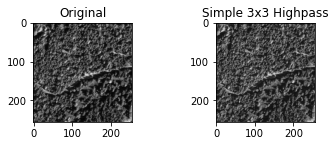

In [15]:


im = Image.open('./fake.png').convert('L')
im=im.resize((256,256))
data = np.array(im, dtype=float)
plot(data, 'Original')

#highpass filter
kernel = np.array([[-1, -1, -1,-1],
                   [-1,  8, 8,-1],
                   [-1, 8, 8,-1],
                  [-1,-1,-1,-1]])
highpass_3x3 = ndimage.convolve(data, kernel)
plot(highpass_3x3, 'Simple 3x3 Highpass')



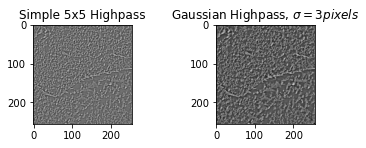

C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\1056386748.py:19: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


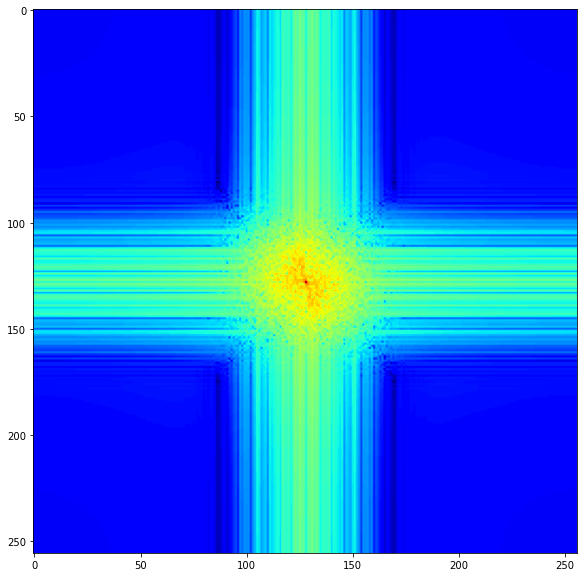

In [16]:

# un autre highpass filter 
kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1,  1,  2,  1, -1],
                   [-1,  2,  4,  2, -1],
                   [-1,  1,  2,  1, -1],
                   [-1, -1, -1, -1, -1]])
highpass_5x5 = ndimage.convolve(data, kernel)
plot(highpass_5x5, 'Simple 5x5 Highpass')

lowpass = ndimage.gaussian_filter(data, 3)
gauss_highpass = data - lowpass
plot(gauss_highpass, r'Gaussian Highpass, $\sigma = 3 pixels$')

plt.show()

F1 = fftpack.fft2((lowpass).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
plt.show()


C:\Users\Valentin\AppData\Local\Temp\ipykernel_2748\818952301.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)


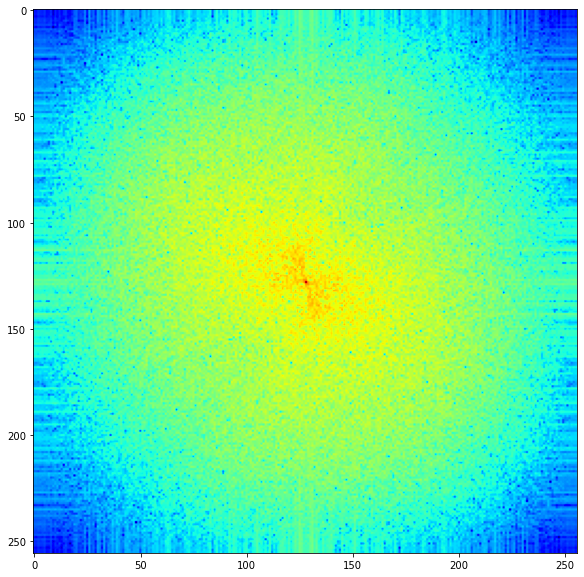

In [17]:

F1 = fftpack.fft2((highpass_3x3).astype(float))
F2 = fftpack.fftshift(F1)
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.jet)
plt.show()

In [ ]:
'''
conclusion : 
mes deep fake sont tro complexe pour cette technique : en effet les erreur opserver ne le sont pas ici comme par exa,mple ici:https://arxiv.org/pdf/1912.11035.pdf
les model les plus resant et les plus resliste ne sont plus d erreur significative dans ce domaine

Cependant on peut clarement remarquer que les fake sont plus lumineau que les reel

'''